In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import sklearn as sk
import joblib
import timeit
from sklearn.preprocessing import StandardScaler

In [3]:
columns = [
    "gender"
    ,"country"
    ,'age'
    ,'hospital_state'
    ,'residential_loc_pre'
    ,'race'
    ,'insurance'
    ,'cad'
    ,'prior_acute_mi'
    #,'prior_acute_mi_yes'
    ,'prior_cardio_surg'
    ,'prior_pci'
    ,'prior_cabg'
    ,'prior_valve_replace'
    ,'prior_tavi'
    ,'prior_bav'
    ,'prior_af'
    ,'prior_generator'
    ,'porcelain_aorta'
    ,'prior_ccf'
    ,'prior_stroke'
    ,'prior_tia'
    ,'prior_carotid_sten'
    ,'prior_pad'
    ,'smoker'
    ,'chronic_lung'
    ,'hostile_chest'
    ,'hypertension'
    ,'diabetes'
    ,'ckd'
    ,'dialysis'
    ,'prior_radiotherapy'
    ,'long_term_steroid'
    ,'meds_ACE_ARB'
    ,'meds_xa_inibitor'
    ,'meds_aspirin'
    ,'meds_p2y12'
    ,'meds_beta_blocker'
    ,'meds_warfarin'
    ,'meds_doac'
    ,'meds_statins'
    ,'meds_diuretics'
    ,'meds_none'
    ,'nyha_status'
    ,'kccq_summ_bl'
    ,'height'
    ,'weight'
    ,'haemoglobin'
    ,'platelet_count'
    ,'albumin'
    ,'creatinine'
    ,'inr'
    ,'egfr_pre'
    ,'fev1'
    ,'ecg_rhythm_sinus'
    ,'ecg_rhythm_Fib_flutter'
    ,'ecg_rhythm_Fibrillation'
    ,'ecg_rhythm_flutter'
    ,'ecg_rhythm_paced'
    ,'ecg_rhythm_junctional'
    ,'ecg_conduct_none'
    ,'ecg_conduct_RBBB'
    ,'ecg_conduct_LBBB'
    ,'ecg_conduct_1DAVBlock'
    ,'ecg_conduct_2DAVBlock'
    ,'ecg_conduct_3DAVBlock'
    ,'ecg_conduct_Paced'
    ,'diseased_vessels_number'
    ,'lm_sten'
    ,'prox_lad'
    ,'rv_systolic'
    ,'lvef_value'
    ,'lv_internal_sys_dim_value'
    ,'lv_internal_dia_dim_value'
    ,'septal_wall'
    ,'posterior_wall'
    ,'av_peak_vel'
    ,'av_mean_grad_tte'
    ,'av_area_tte'
    ,'dp_index_tte_pre'
    ,'aortic_insuff'
    ,'mitral_regurg'
    ,'av_disease_etiology'
    ,'annulus_max_dim'
    ,'annulus_min_dim'
    ,'perimeter'
    ,'annulus_area_ctaort'
    ,'st_junc_diam'
    ,'valve_calc'
    ,'annualar_calc_ctaort'
    ,'valve_morph'
    ,'aortic_sinus_dim_left'
    ,'aortic_sinus_dim_right'
    ,'aortic_sinus_dim_non_coron'
    ,'ascending_ao'
    ,'lmca_height'
    ,'rca_height'
    ,'iliac_mld_left'
    ,'iliac_mld_right'
    ,'femoral_mld_left'
    ,'femoral_mld_right'
    ,'artery_calc'
    ,'iliofem_tort'
    ,'high_cfa_burif'
    #,'high_cfa_burif_yes'
    ,'prev_iliofem_interv'
    #,'prev_iliofem_interv_yes'
    ,'procedure_indic'
    #,'bio_valve_fail_reason'
    ,'valve_in_valve'
    ,'anaesthesia'
    ,'access_site'
    ,'access_method'
    ,'initial_bav'
    ,'device_manufacturer_1'
    ,'device_model_1'
    ,"bmi"
]


    
categorical_col = [
    "gender"
    ,"country"
    ,'hospital_state'
    ,'residential_loc_pre'
    ,'race'
    ,'insurance'
    ,'cad'
    ,'prior_acute_mi'
    #,'prior_acute_mi_yes'
    ,'prior_cardio_surg'
    ,'prior_pci'
    ,'prior_cabg'
    ,'prior_valve_replace'
    ,'prior_tavi'
    ,'prior_bav'
    ,'prior_af'
    ,'prior_generator'
    ,'porcelain_aorta'
    ,'prior_ccf'
    ,'prior_stroke'
    ,'prior_tia'
    ,'prior_carotid_sten'
    ,'prior_pad'
    ,'smoker'
    ,'chronic_lung'
    ,'hostile_chest'
    ,'hypertension'
    ,'diabetes'
    ,'ckd'
    ,'dialysis'
    ,'prior_radiotherapy'
    ,'long_term_steroid'
    ,'meds_ACE_ARB'
    ,'meds_xa_inibitor'
    ,'meds_aspirin'
    ,'meds_p2y12'
    ,'meds_beta_blocker'
    ,'meds_warfarin'
    ,'meds_doac'
    ,'meds_statins'
    ,'meds_diuretics'
    ,'meds_none'
    ,'nyha_status'
    ,'ecg_rhythm_sinus'
    ,'ecg_rhythm_Fib_flutter'
    ,'ecg_rhythm_Fibrillation'
    ,'ecg_rhythm_flutter'
    ,'ecg_rhythm_paced'
    ,'ecg_rhythm_junctional'
    ,'ecg_conduct_none'
    ,'ecg_conduct_RBBB'
    ,'ecg_conduct_LBBB'
    ,'ecg_conduct_1DAVBlock'
    ,'ecg_conduct_2DAVBlock'
    ,'ecg_conduct_3DAVBlock'
    ,'ecg_conduct_Paced'
    ,'diseased_vessels_number'
    ,'lm_sten'
    ,'prox_lad'
    ,'aortic_insuff'
    ,'mitral_regurg'
    ,'av_disease_etiology'
    ,'valve_calc'
    ,'annualar_calc_ctaort'
    ,'valve_morph'
    ,'artery_calc'
    ,'iliofem_tort'
    ,'high_cfa_burif'
    #,'high_cfa_burif_yes'
    ,'prev_iliofem_interv'
    #,'prev_iliofem_interv_yes'
    ,'procedure_indic'
    #,'bio_valve_fail_reason'
    ,'valve_in_valve'
    ,'anaesthesia'
    ,'access_site'
    ,'access_method'
    ,'initial_bav'
    ,'device_manufacturer_1'
    ,'device_model_1'
]

float_col = [x for x in columns if x not in categorical_col]


In [4]:
train = pd.read_csv("train.csv",index_col = 0)
#X_train = train.query('death_observed == True or death_in_study == False')
outcome_columns = ['death_in_study','upper_bound',
                       'discharge_status_new','fup_status_30d_new', 'fup_status_12mth_new','lower_bound','death_observed',
                  'event_observed', 'event_max','event_min','event_mid']
X_train = train.drop(outcome_columns,axis=1)
X_train = X_train.drop(["egfr_pre"],axis=1)

In [5]:
scaler =  StandardScaler()
X_train_scale = scaler.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale,columns=X_train.columns,index=train.index)

y = train[["event_observed","event_max" ]]

records = y.to_records(index=False)
y_train = np.array(records, dtype = records.dtype.descr)
test = pd.read_csv("test.csv",index_col = 0)

X_test = test.drop(outcome_columns,axis=1)
X_test = X_test.drop(["egfr_pre"],axis=1)
X_test_scale = scaler.transform(X_test)
X_test_scale = pd.DataFrame(X_test_scale,columns=X_test.columns,index=test.index)

y_test = test[["event_observed","event_max" ]]

records = y_test.to_records(index=False)
y_test = np.array(records, dtype = records.dtype.descr)

In [5]:
from lifelines.statistics import logrank_test

In [6]:
# logrank test to see if the train and test set is different
logrank_test(y_train["event_max"], 
             y_test["event_max"], 
             event_observed_A=y_train["event_observed"], 
             event_observed_B=y_test["event_observed"])

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.34 0.56      0.84

In [7]:
column_to_test = [c for c in X_train.columns if c not in float_col]

test_results = pd.DataFrame(columns=["category","test_statistic","p_value","reject"])

i =0
for c in column_to_test:
    df1, df2 = [x for _, x in X_train.groupby(X_train[c] == 0)]
    y1_event = train.loc[df1.index,"event_max"]
    y2_event = train.loc[df2.index,"event_max"]
    y1_obs = train.loc[df1.index,"event_observed"]
    y2_obs = train.loc[df2.index,"event_observed"]
    results = logrank_test(y1_event, 
             y2_event, 
             event_observed_A=y1_obs, 
             event_observed_B=y2_obs)
    temp = {"category":c,"test_statistic":results.test_statistic,"p_value": results.p_value,"reject":results.p_value <= 0.05}
    temp_df = pd.DataFrame(temp,index=[i])
    test_results = pd.concat([test_results,temp_df],axis=0)
    i+=1

C:\Users\harri\AppData\Local\Temp\ipykernel_7068\3583922952.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test_results = pd.concat([test_results,temp_df],axis=0)


In [11]:
test_results.query("reject == True")['category']

7                   prior_bav_1.0
8                    prior_af_1.0
9             prior_generator_1.0
10                  prior_ccf_1.0
16         prior_carotid_sten_5.0
17                  prior_pad_1.0
18               chronic_lung_2.0
19               chronic_lung_3.0
20               chronic_lung_4.0
23                        ckd_1.0
24                   dialysis_1.0
25               meds_ACE_ARB_1.0
26               meds_aspirin_1.0
27                 meds_p2y12_1.0
30               meds_statins_1.0
31             meds_diuretics_1.0
32                nyha_status_3.0
33           ecg_rhythm_sinus_1.0
34    ecg_rhythm_Fibrillation_1.0
42    diseased_vessels_number_4.0
43                   prox_lad_1.0
47              mitral_regurg_1.0
52                artery_calc_2.0
53                artery_calc_3.0
54                artery_calc_4.0
59        prev_iliofem_interv_1.0
Name: category, dtype: object

In [10]:
test_results.to_csv('results/logrank_test.csv')

In [17]:
float_column_to_test = [c for c in X_train.columns if c in float_col]

corr = X_train_scale.loc[:,float_column_to_test].corr()
corr.style.background_gradient(cmap='coolwarm')

,lvef_value,kccq_summ_bl,age,height,weight,haemoglobin,platelet_count,albumin,creatinine,lv_internal_dia_dim_value,septal_wall,posterior_wall,av_peak_vel,av_mean_grad_tte,av_area_tte,annulus_max_dim,annulus_min_dim,perimeter,annulus_area_ctaort,ascending_ao,lmca_height,rca_height,iliac_mld_left,iliac_mld_right,femoral_mld_left,femoral_mld_right,bmi
lvef_value,1.000000,0.125733,0.079890,-0.123678,-0.028497,0.013067,0.036305,0.150508,-0.131321,-0.309443,0.068335,0.062277,0.099153,0.207750,0.024609,-0.186796,-0.186803,-0.107188,-0.170088,-0.036706,-0.013276,-0.041857,-0.004995,-0.009627,-0.011909,-0.012844,0.027065
kccq_summ_bl,0.125733,1.000000,0.006122,0.081078,-0.070910,0.167315,-0.046162,0.173314,-0.094197,-0.045949,-0.002442,-0.003544,0.033563,0.073526,-0.016929,0.034147,0.028152,0.016227,0.017426,0.029828,0.044589,0.044392,0.075188,0.077556,0.110629,0.107377,-0.119710
age,0.079890,0.006122,1.000000,-0.155099,-0.343901,-0.108687,-0.002312,-0.017917,-0.077209,-0.137150,0.023814,0.003366,-0.012843,-0.036001,-0.101109,-0.077673,-0.099560,-0.045109,-0.088196,-0.028557,0.034065,0.011374,-0.005772,-0.000917,-0.021308,-0.013611,-0.269815
height,-0.123678,0.081078,-0.155099,1.000000,0.425838,0.175541,-0.142662,-0.000921,0.110962,0.237926,0.062188,0.066253,-0.037644,-0.066768,0.157790,0.433054,0.450406,0.261389,0.397098,0.136816,0.238166,0.277382,0.223381,0.235955,0.300873,0.291105,-0.141364
weight,-0.028497,-0.070910,-0.343901,0.425838,1.000000,0.165820,-0.084776,0.014670,0.079162,0.224317,0.112485,0.106711,-0.015134,-0.011479,0.166649,0.300790,0.319174,0.177644,0.273463,0.117834,0.081861,0.137824,0.240929,0.237204,0.255630,0.246083,0.805424
haemoglobin,0.013067,0.167315,-0.108687,0.175541,0.165820,1.000000,-0.069477,0.289691,-0.211645,-0.012934,0.016919,-0.005391,-0.023480,-0.041782,0.028892,0.108943,0.130278,0.053844,0.100301,0.057997,0.085436,0.091223,0.074681,0.074339,0.084578,0.090715,0.075012
platelet_count,0.036305,-0.046162,-0.002312,-0.142662,-0.084776,-0.069477,1.000000,-0.008255,-0.064407,-0.072009,-0.019239,-0.032636,0.019801,0.038023,-0.051280,-0.077181,-0.120886,-0.051557,-0.097865,-0.054450,-0.035529,-0.047180,-0.064823,-0.059542,-0.087556,-0.088891,-0.010703
albumin,0.150508,0.173314,-0.017917,-0.000921,0.014670,0.289691,-0.008255,1.000000,-0.164359,-0.056964,0.003393,0.002367,-0.001670,-0.000766,0.030083,-0.031511,-0.016521,-0.014759,-0.006992,-0.002186,0.005115,0.017444,0.032486,0.026481,0.036255,0.038272,0.011388
creatinine,-0.131321,-0.094197,-0.077209,0.110962,0.079162,-0.211645,-0.064407,-0.164359,1.000000,0.111708,0.020802,0.027315,-0.014770,-0.051975,0.036246,0.095258,0.082232,0.057521,0.075575,0.019520,0.023934,0.049387,0.007991,0.002272,0.028733,0.025852,0.022012
lv_internal_dia_dim_value,-0.309443,-0.045949,-0.137150,0.237926,0.224317,-0.012934,-0.072009,-0.056964,0.111708,1.000000,-0.037113,-0.001006,-0.037137,-0.097701,0.098862,0.211682,0.222023,0.127760,0.205513,0.080020,0.060645,0.097484,0.111562,0.107241,0.133444,0.118637,0.106713


In [32]:
# pearson coefficicient
pearson_df = pd.DataFrame(columns = ['var1','var2','statistic','p_val'])
from scipy.stats import pearsonr
for i in float_column_to_test:
    for j in float_column_to_test:
        test_result = pearsonr(X_train_scale.loc[:,i],X_train_scale.loc[:,j])
        temp_dict = pd.DataFrame({
            'var1': [i],'var2': [j],'statistic': [test_result.statistic],'p_val': [test_result.pvalue]
        })
        pearson_df = pd.concat([pearson_df,temp_dict],axis=0,ignore_index=True)

pearson_df.to_csv('results/pearsonr_test.csv')

C:\Users\harri\AppData\Local\Temp\ipykernel_7068\2140081081.py:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pearson_df = pd.concat([pearson_df,temp_dict],axis=0,ignore_index=True)


In [34]:
pearson_df.query('p_val > 0.05')

,var1,var2,statistic,p_val
5,lvef_value,haemoglobin,0.013067,0.137840
20,lvef_value,lmca_height,-0.013276,0.131629
22,lvef_value,iliac_mld_left,-0.004995,0.570575
23,lvef_value,iliac_mld_right,-0.009627,0.274263
24,lvef_value,femoral_mld_left,-0.011909,0.176243
...,...,...,...,...
677,femoral_mld_right,age,-0.013611,0.122187
708,bmi,platelet_count,-0.010703,0.224199
709,bmi,albumin,0.011388,0.195943
714,bmi,av_peak_vel,0.004192,0.634027


In [36]:
# check for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame() 
vif_data["feature"] = float_column_to_test
vif_data["VIF"] = [variance_inflation_factor(X_train_scale.loc[:,float_column_to_test], i) 
                          for i in range(len(float_column_to_test))] 


In [37]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(vif_data.sort_values(by="VIF",ascending=False))

                      feature        VIF
4                      weight  18.901435
26                        bmi  15.592373
3                      height   7.261275
24           femoral_mld_left   2.942227
25          femoral_mld_right   2.927255
23            iliac_mld_right   2.716185
22             iliac_mld_left   2.682088
15            annulus_max_dim   2.339671
16            annulus_min_dim   2.288102
18        annulus_area_ctaort   2.067842
10                septal_wall   1.465562
11             posterior_wall   1.459529
21                 rca_height   1.413221
13           av_mean_grad_tte   1.401910
20                lmca_height   1.340904
17                  perimeter   1.294369
0                  lvef_value   1.262402
5                 haemoglobin   1.234393
9   lv_internal_dia_dim_value   1.218090
12                av_peak_vel   1.206141
14                av_area_tte   1.199707
2                         age   1.191907
7                     albumin   1.147534
8               

C:\Users\harri\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\harri\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


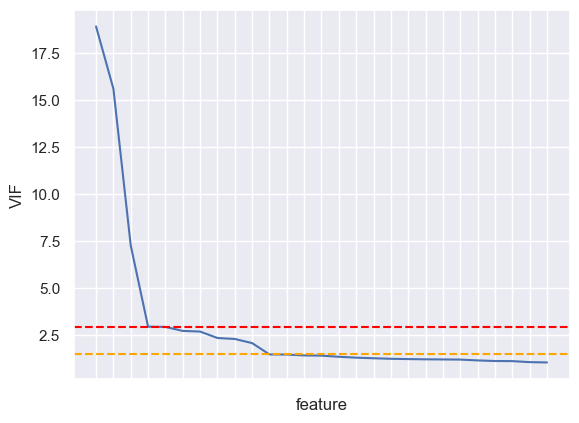

In [39]:
ax = sns.lineplot(vif_data.sort_values(by="VIF",ascending=False),x='feature',y='VIF')
ax.set_xticklabels("")
ax.axhline(y = 2.942227,color='red',linestyle = '--') 
ax.axhline(y =1.465562,color='orange',linestyle = '--') 

In [40]:
vif_data.to_csv('results/vif_test.csv')

<BarContainer object of 94 artists>

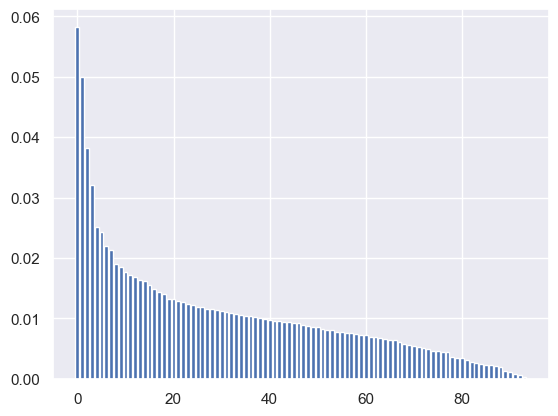

In [6]:
from sklearn.decomposition import PCA

pca = PCA(whiten = True)
pca.fit(X_train_scale)
plt.bar(np.arange(0,len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_)

In [7]:
pca_trans = pca.transform(X_train_scale)

C:\Users\harri\AppData\Local\Temp\ipykernel_14020\1048319203.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


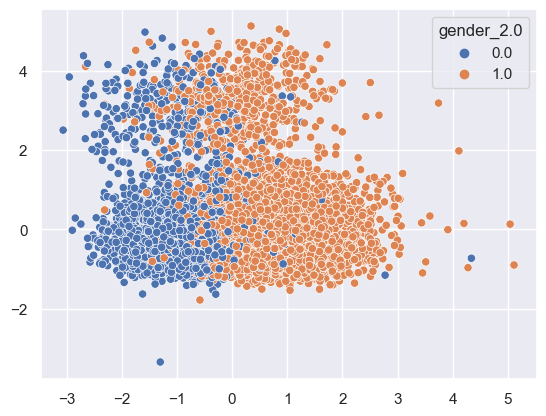

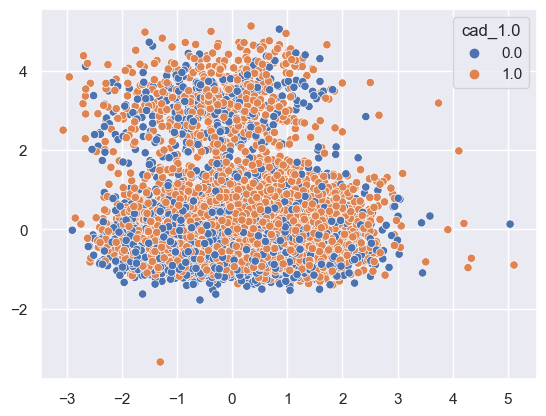

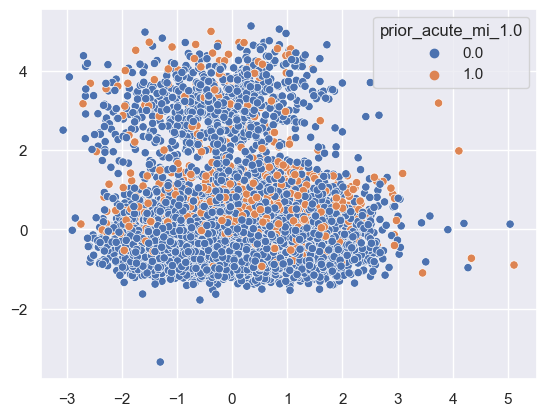

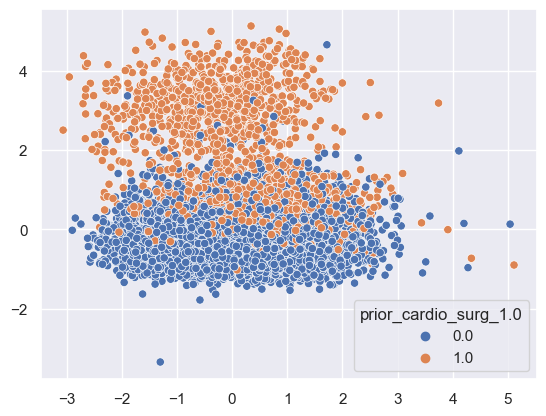

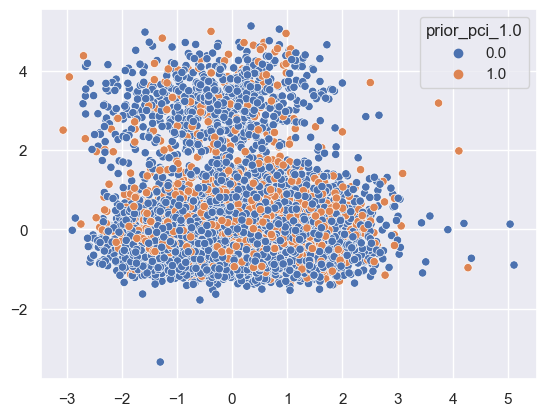

...

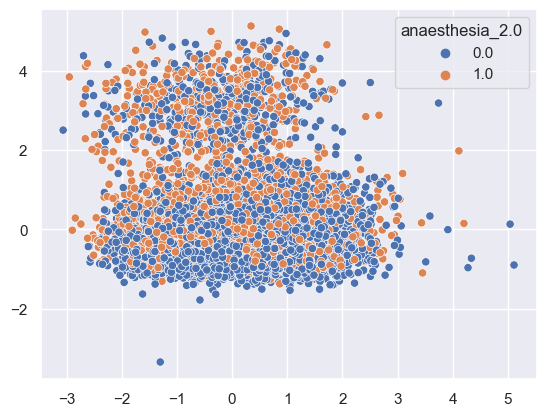

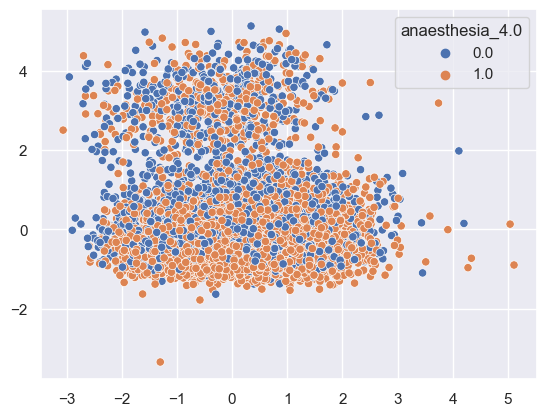

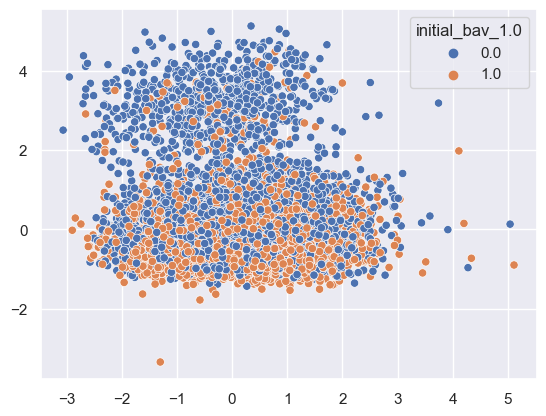

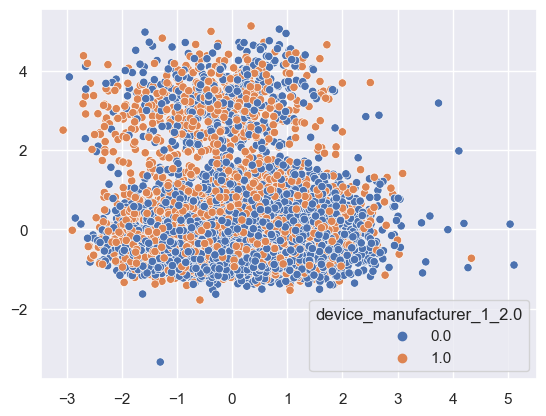

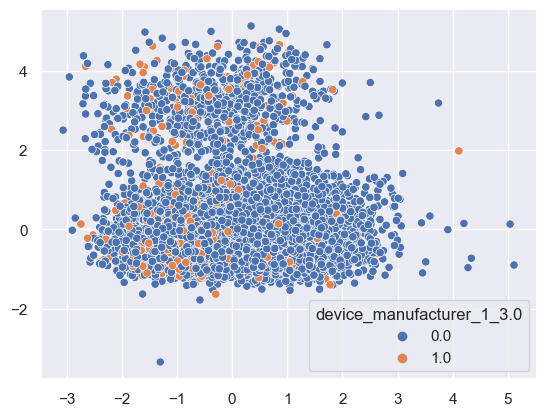

In [122]:
for c in column_to_test:
    plt.figure()
    ax = plt.subplot(111)
    sns.scatterplot(x= pca_trans[:,0],y = pca_trans[:,1],hue = X_train.loc[:,c],ax=ax)

<Axes: >

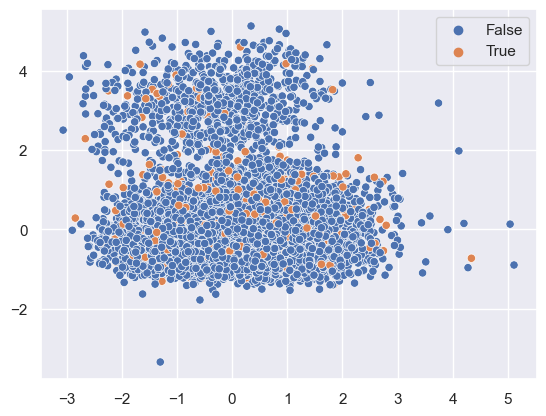

In [9]:
 ax = plt.subplot(111)
sns.scatterplot(x= pca_trans[:,0],y = pca_trans[:,1],hue = y_train['event_observed'],ax=ax)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

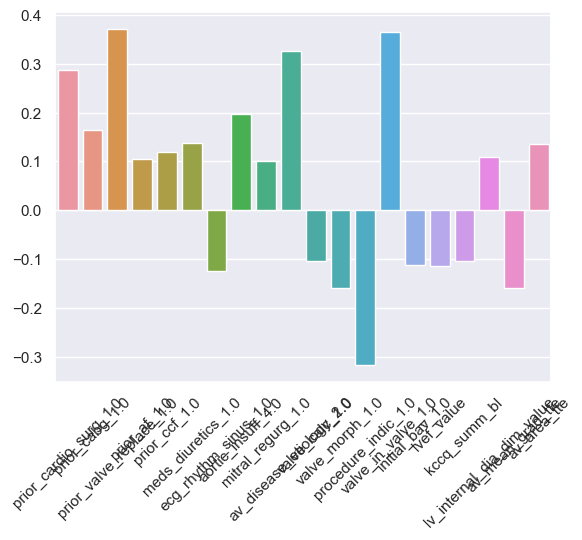

In [24]:
ax = sns.barplot(x=pca.feature_names_in_[np.abs(pca.components_[1,:])>0.1], y=pca.components_[1,np.abs(pca.components_[1,:])>0.1])
plt.setp(ax.get_xticklabels(), rotation=45)

## Univariate coxph

In [56]:
from lifelines import CoxPHFitter

univar_result = pd.DataFrame(columns = ['coef','se(coef)','z','p'])

cph = CoxPHFitter()
for c in X_train_scale.columns:
    temp_train = X_train_scale.loc[:,c]
    temp_train = pd.concat([temp_train,y],axis=1)
    cph.fit(temp_train, duration_col='event_max', event_col='event_observed')
    univar_result = pd.concat([univar_result,cph.summary[['coef','se(coef)','z','p']]],axis=0,ignore_index=False)

C:\Users\harri\AppData\Local\Temp\ipykernel_7068\295076204.py:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  univar_result = pd.concat([univar_result,cph.summary[['coef','se(coef)','z','p']]],axis=0,ignore_index=False)


In [60]:
univar_result.to_csv('results/coxph_univariate_test.csv')